## Descubriendo Exoplanetas

*Realizado por Carlos Mendoza R.*

#### El objetivo de este desafio es automatizar la clasificación o corraboración de exoplanetas a través de modelos de machine learning con las variables que se utilizaron para clasificarlos. 


#### Es por ello, que este proyecto esta estructurado de la siguiente manera: 
1. Entendimiento del problema. 
2. Entendimiento de la información(data).
4. Plantemiento de la solución. 
3. Limpieza de la data. 
4. Análisis explotario de las variables. 
5. Transformación o preparación de las variables para el modelo. 
6. Entrenamiento de los modelos. 
7. Obtención de las variables de testeo. 
8. Elección de modelo y aplicación. 
9. Conclusiones, comentarios, etc. 


### Entendimiento del problema.
Se tiene que encontrar un modelo que permita automatizar las técnicas de clasificación utilizadas. Realizando un modelo que nos permita obtener si los planetas son confirmados o no. 

In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt 
import plotly.express as px

import scipy.stats as ss
import seaborn as sns

plt.style.use('seaborn')

#### Definición de variable objetivo: 
La variable objetivo viene dada por koi_disposition que nos entrega la clasificación de los exoplanetas, esta puede ser:
- CONFIRMED
- FALSE POSITIVE
- CANDIDATE

Como el objetivo es plantear un modelo que solo obtenga los planetas confirmados, las varibales false positive y candidate seran agrupados en conjunto como 0 y las confirmed como 1. 

Se va estudiar la variable objetivo y ver la relación que se tiene dentro de la data. 

In [3]:
data = pd.read_csv('exoplanetas.csv', sep = ',')
df = data.copy()
df.pop('Unnamed: 0')
koi_disposition_values = pd.DataFrame(df.koi_disposition.value_counts())
koi_disposition_values
fig = px.bar(koi_disposition_values, text_auto='',
                color=["FALSE POSITIVE", "CONFIRMED", "CANDIDATE"],
                color_discrete_sequence= ['gray','red','gray'],
                title = 'Valores de la variable objetivo koi_disposition')
fig.show()

#plt.bar()

Sacaremos los procentajes de participación de estas variables:

- Donde se observa que existe un 25% de las datos son confirmados, un 50% falsos positivos y un 24% candidatos. 
- Se tiene una base de datos desbalanceada en terminos de Confirmados.

In [ ]:
koi_disposition_values/koi_disposition_values.sum()

,koi_disposition
FALSE POSITIVE,0.501216
CONFIRMED,0.257474
CANDIDATE,0.241310


En el sigueinte código se guardan los nombres de las variables y el tipo de variables en un excel con el fin de entender el tipo de variables que estamos estudando. (Se observa que todas son variables númericas, algúnas enteras, otras flotantes y algunas hacen referencias a fechas transformadas en flotantes)

In [ ]:
variables = df.columns
types = df.dtypes
types.to_excel('types_variables.xlsx')

Antes de realizar cualquier calculo estadistico verificos si existen valores nulos o en blanco. 

(No hay valores nulos ni blancos por lo que no es necesario utilizar un método de llenado de información)

In [ ]:
nulls = df.isnull().sum()
nulls[nulls>0]

Series([], dtype: int64)

Ahora si se puederealizar el estudio por grupo de variable objetivo. 
- PRIMERO SE VA A REALIZAR UN ESTUDIO DE LAS ESTADISTICAS DESCRIPTIVAS DE TODAS LAS VARIABLES SIN GRUPO 

In [ ]:

def display_clean(obj):
    """Función para limpiar los resultados del DataFrame
    Return: una lógica robada de internet jajaja que dejan limpios los valores.
    """
    return obj.applymap(lambda x: str(int(x)) if abs(x - int(x)) < 1e-6 else str(round(x,3)))

stats = df.describe().transpose()
display_clean(stats)

,count,mean,std,min,25%,50%,75%,max
koi_fpflag_nt,6991,0.157,0.364,0,0,0,0,1
koi_fpflag_ss,6991,0.245,0.43,0,0,0,0,1
koi_fpflag_co,6991,0.203,0.402,0,0,0,0,1
koi_fpflag_ec,6991,0.125,0.331,0,0,0,0,1
koi_period,6991,56.191,117.571,0.26,2.62,8.947,34.283,1071.233
koi_period_err1,6991,0.002,0.007,0,0.0,0.0,0.0,0.157
koi_period_err2,6991,-0.002,0.007,-0.157,-0.0,-0.0,-0.0,0
koi_time0bk,6991,164.489,67.02,120.516,132.684,136.739,169.937,1472.522
koi_time0bk_err1,6991,0.009,0.022,0.0,0.001,0.004,0.01,0.569
koi_time0bk_err2,6991,-0.009,0.022,-0.569,-0.01,-0.004,-0.001,-0.0


- Se observa que los valores de las variables tienen distintos ordendes de magnitud lo que nos indica que debiesemos utilizar alguna tranformación para estandarizar a la hora de utilizar un modelo.

- La cantida de datos son 6991. 

 #### Ahora se procede a realizar el estudio de medias en función de los grupos presentes en las variables objetivos. 


In [ ]:
false_positives = df[df.koi_disposition == 'FALSE POSITIVE'] # Filtros para separar los datos
confirmed = df[df.koi_disposition == 'CONFIRMED'] # Filtros para separar los datos

false_positives.pop('koi_disposition') # Eliminar la columna objetivo
confirmed.pop('koi_disposition') # Eliminar la columna objetivo

means = pd.DataFrame() # Para agrupar las medias en una tabla 
means['FALSE POSITIVE'] = false_positives.mean()
means['CONFIRMED'] = confirmed.mean()
means.head()

,FALSE POSITIVE,CONFIRMED
koi_fpflag_nt,0.308505,0.009444
koi_fpflag_ss,0.476027,0.011667
koi_fpflag_co,0.403253,0.003333
koi_fpflag_ec,0.249144,0.000556
koi_period,66.103066,26.451343


#### Identificación de diferencias de medias a través de la hipótesis de la media. 

- Se calcula los intervalos de confianza a 95% para las series. 
- Se calcula el valor p del ttest para determinar si son distintos. Se utiliza un 5% de significancia. 


In [ ]:
def get_confidence_interval(serie):
    "Función para obtener el intervalo de confianza"
    return ss.norm.interval(alpha= 0.95, loc = np.mean(serie),scale = ss.sem(serie))
def mean_hipotesis(serie1,serie2):
    """ Función para realizar el test de hipotesis de la media.
    retorna el valor p 
    """
    return ss.ttest_ind(serie1,serie2)[1]

intervals_false_positive = get_confidence_interval(false_positives)
intervals_confirmed = get_confidence_interval(confirmed)

means['FP:LI'] = intervals_false_positive[0]
means['FP:LS'] = intervals_false_positive[1]
means['CM:LI'] = intervals_confirmed[0]
means['CM:LS'] = intervals_confirmed[1]
means['pvalue'] = mean_hipotesis(false_positives,confirmed)

print(means[means.pvalue >0.05].index)
display_clean(means[means.pvalue >0.05]) # filtro para serparar las medias distintas



Index(['koi_impact_err2', 'koi_depth_err1', 'koi_depth_err2', 'koi_prad_err2'], dtype='object')


,FALSE POSITIVE,CONFIRMED,FP:LI,FP:LS,CM:LI,CM:LS,pvalue
koi_impact_err2,-0.337,-0.312,-0.389,-0.285,-0.325,-0.299,0.501
koi_depth_err1,230.948,21.749,11.687,450.209,18.82,24.678,0.18
koi_depth_err2,-230.948,-21.749,-450.209,-11.687,-24.678,-18.82,0.18
koi_prad_err2,-79.497,-0.382,-143.403,-15.59,-0.413,-0.35,0.082


- Se puede observar que existen 4 variables donde la medía son signficativamente  diferentes con un nivel de confianza de un 95%. Se observa que los errores + y -  de las variables depth tienen distinta media. Que las variables impact y prad en sus errores - tienen medias distintas. 
- Ahora se podría llegar a la conclusión que para estas variables tienen tendencia e influencia para separar los cluster de Falso postivo y Confirmed. 

- **Estas variables podrían ser de interes para entender que una diferencia en los grupos puede determinar si pertence al grupo de Falso postivo o Confirmados.** ( No las eliminaria para el modelo, sino que todo lo contrario, las considero prioritarias)


In [5]:
binaries_variables = ['koi_disposition','koi_fpflag_nt', 'koi_fpflag_ss', 'koi_fpflag_co',
       'koi_fpflag_ec']
continues_variables = ['koi_disposition','koi_period', 'koi_period_err1', 'koi_period_err2',
       'koi_time0bk', 'koi_time0bk_err1', 'koi_time0bk_err2', 'koi_impact',
       'koi_impact_err1', 'koi_impact_err2', 'koi_duration',
       'koi_duration_err1', 'koi_duration_err2', 'koi_depth', 'koi_depth_err1',
       'koi_depth_err2', 'koi_prad', 'koi_prad_err1', 'koi_prad_err2',
       'koi_teq', 'koi_insol', 'koi_insol_err1', 'koi_insol_err2',
       'koi_model_snr', 'koi_tce_plnt_num', 'koi_steff', 'koi_steff_err1',
       'koi_steff_err2', 'koi_slogg', 'koi_slogg_err1', 'koi_slogg_err2',
       'koi_srad', 'koi_srad_err1', 'koi_srad_err2', 'ra', 'dec',
       'koi_kepmag']

Creación de histogramas. (Al exportalos a html no se van a ver por la libreria Plotly)

In [6]:
for serie in continues_variables:
    #serie.plot.histogram(color = 'koi_disposition')
    histogram = px.histogram(df,x = serie,color = 'koi_disposition')
    histogram.show()

- Separar las variables que tengan un comportamiento parecido de tal manera que no produzcan colinealidad y no interfieran en futuros analisis de la importancia o efectos que tienen las variables en la predicción del modelo

- Por lo tanto, se calcula la correlación entre variables. 

<AxesSubplot:>

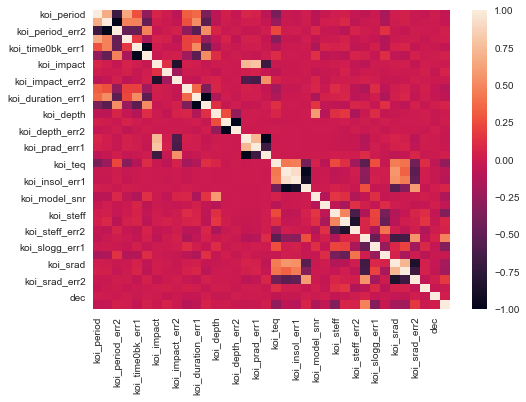

In [25]:
corr = df[continues_variables].corr()
sns.heatmap(corr)


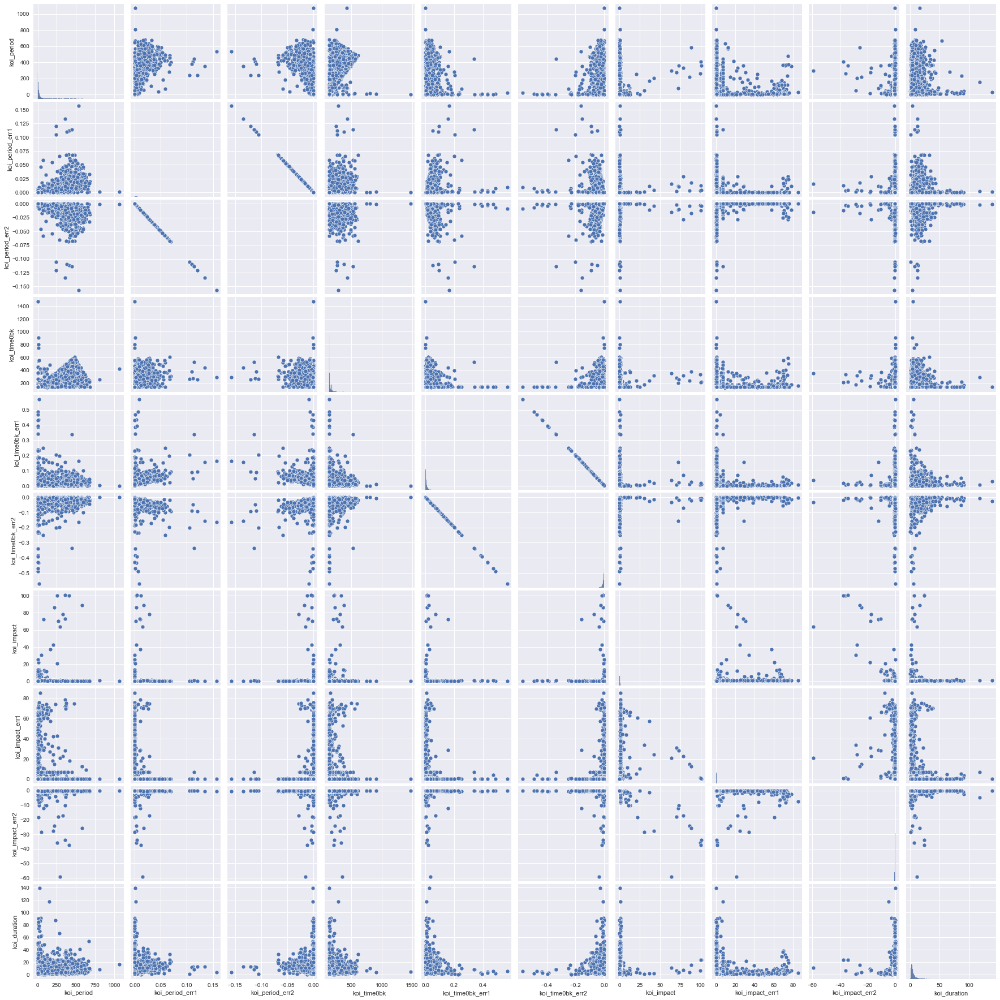

In [16]:
continues_variables = ['koi_disposition','koi_period', 'koi_period_err1', 'koi_period_err2',
       'koi_time0bk', 'koi_time0bk_err1', 'koi_time0bk_err2', 'koi_impact',
       'koi_impact_err1', 'koi_impact_err2', 'koi_duration']
sns.pairplot(df[continues_variables])

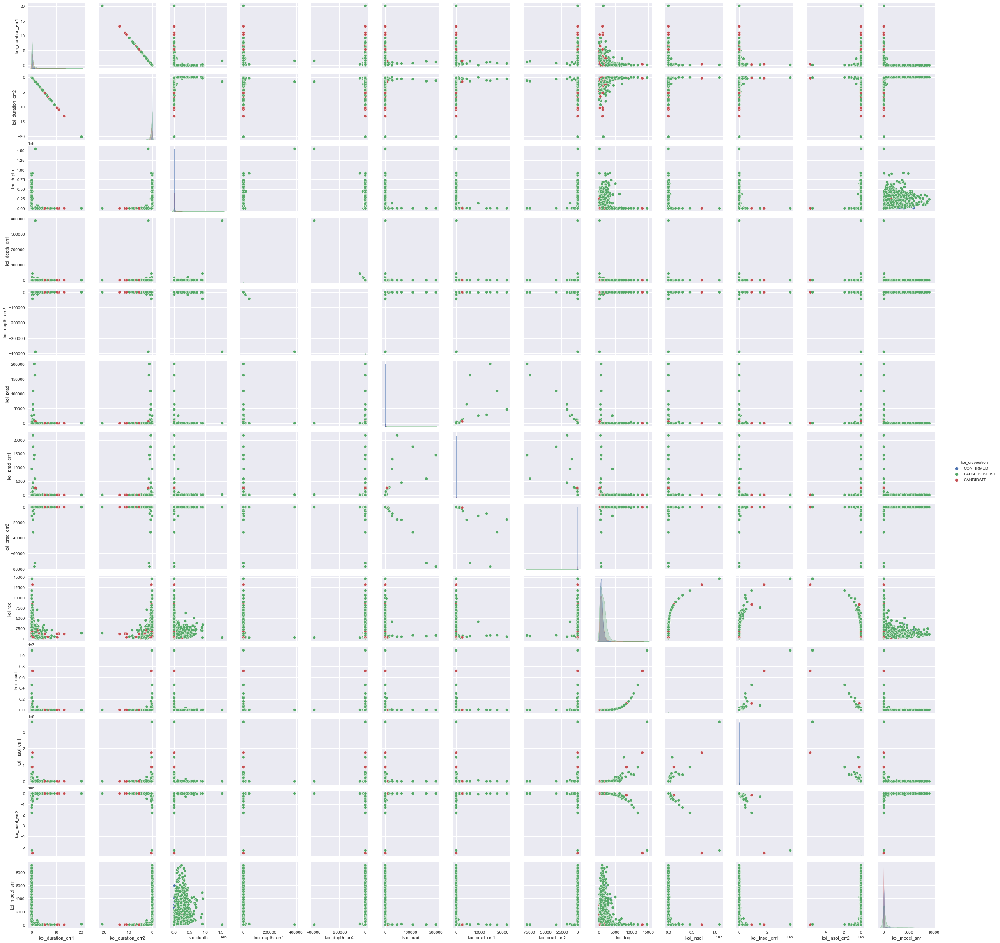

In [12]:
continues_variables2 = ['koi_disposition',
       'koi_duration_err1', 'koi_duration_err2', 'koi_depth', 'koi_depth_err1',
       'koi_depth_err2', 'koi_prad', 'koi_prad_err1', 'koi_prad_err2',
       'koi_teq', 'koi_insol', 'koi_insol_err1', 'koi_insol_err2',
       'koi_model_snr']
sns.pairplot(df[continues_variables2], hue = 'koi_disposition')


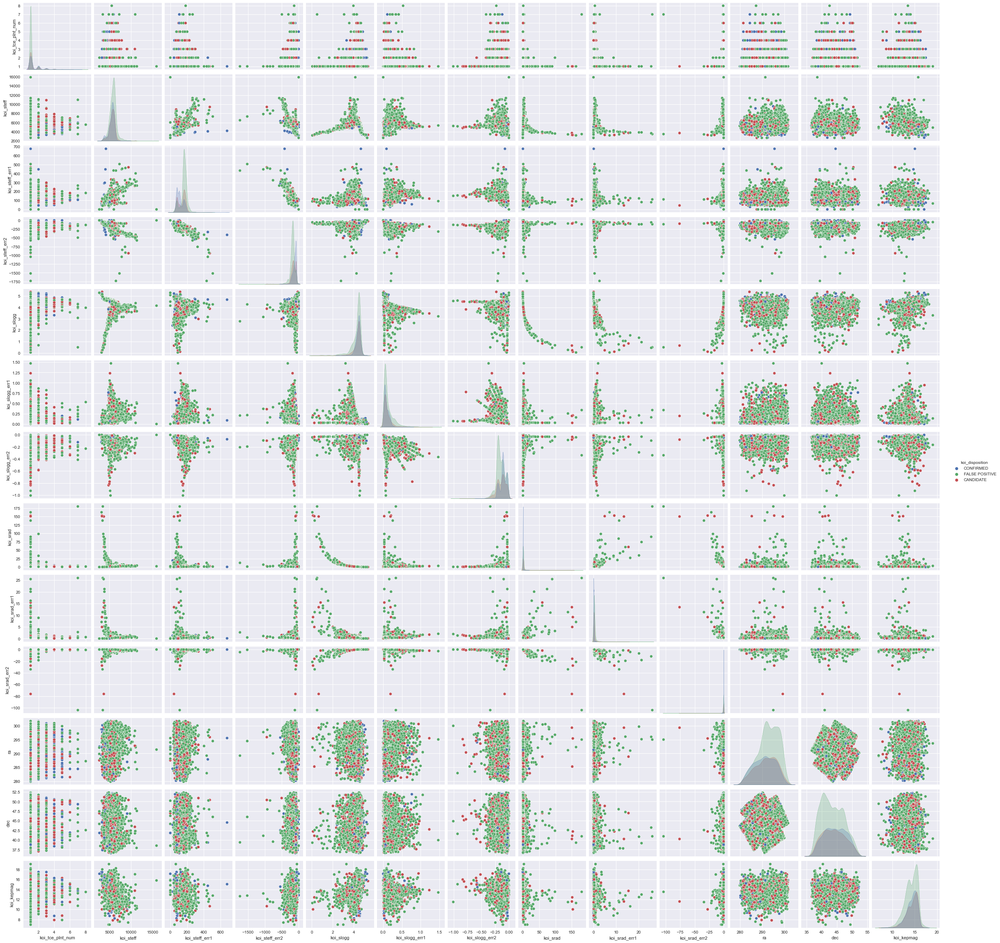

In [14]:
continues_variables3 = ['koi_disposition','koi_tce_plnt_num', 'koi_steff', 'koi_steff_err1',
       'koi_steff_err2', 'koi_slogg', 'koi_slogg_err1', 'koi_slogg_err2',
       'koi_srad', 'koi_srad_err1', 'koi_srad_err2', 'ra', 'dec',
       'koi_kepmag']
sns.pairplot(df[continues_variables3],hue = 'koi_disposition')

# Explicación de la selección de variables. 
- Seleccione las variables binarias con el fin de tener no solo variables continuas. Además que encontré de valor la explicación y comportamiento de estas. 
- Seleccione las variables que se separaron con la hiposteiss de la media. Considerandolas como que afectan a que influyen en que los planteas sean del cluster confirmados o cluster falsos positivos. 
- Considere las variables que no estuvieran muy relacionadas entre sí con el fin de disminuir la colinealidad entre estas para el caso futuro de que queramos saber los efectos cualitativos de estas variables y que no se pisen entre sí. 
- Agregue variables que tenian comportamientos distintos en los histogramas. (similar al enfoque de la media)
- Las variables de tiempo fueron consideradas también. Sin categorización sino como flotantes comos se veían.


In [ ]:
features_variables = ['koi_fpflag_nt','koi_fpflag_ss','koi_fpflag_co','koi_fpflag_ec',
'koi_impact_err2', 'koi_depth_err1', 'koi_depth_err2', 'koi_prad_err2',
'koi_period','koi_time0bk','koi_impact','koi_impact_err1','koi_impact_err2',
'koi_steff','koi_steff_err1','koi_steff_err2','koi_model_snr','koi_srad','koi_duration'
]
model_variables = ['koi_disposition','koi_fpflag_nt','koi_fpflag_ss','koi_fpflag_co','koi_fpflag_ec',
'koi_impact_err2', 'koi_depth_err1', 'koi_depth_err2', 'koi_prad_err2',
'koi_period','koi_time0bk','koi_impact','koi_impact_err1','koi_impact_err2',
'koi_steff','koi_steff_err1','koi_steff_err2','koi_model_snr','koi_srad','koi_duration'
]
len(features_variables)

19

##### Variables
-	koi_disposition: Clase, variable objetivo. object
-	koi_fpflag_nt: 1. Luz no consistente. 0 Other	int64
-	koi_fpflag_ss: 1. Tiene un evento secundario. 0 Other. 	int64
-	koi_fpflag_co: 1. Centroide off-set. 0 Other. 	int64
-	koi_fpflag_ec:	1. Match efimero, contaminación. 0 Other. int64
-	koi_period: Periodo (days). float64
-	koi_period_err1:  	float64
-	koi_period_err2: 	float64
-	koi_time0bk	float64
-	koi_time0bk_err1	float64
-	koi_time0bk_err2	float64
-	koi_impact	float64
-	koi_impact_err1	float64
-	koi_impact_err2	float64
-	koi_duration	float64
-	koi_duration_err1	float64
-	koi_duration_err2	float64
-	koi_depth	float64
-	koi_depth_err1	float64
-	koi_depth_err2	float64
-	koi_prad	float64
-	koi_prad_err1	float64
-	koi_prad_err2	float64
-	koi_teq	int64
-	koi_insol	float64
-	koi_insol_err1	float64
-	koi_insol_err2	float64
-	koi_model_snr	float64
-	koi_tce_plnt_num	int64
-	koi_steff	int64
-	koi_steff_err1	int64
-	koi_steff_err2	int64
-	koi_slogg	float64
-	koi_slogg_err1	float64
-	koi_slogg_err2	float64
-	koi_srad	float64
-	koi_srad_err1	float64
-	koi_srad_err2	float64
-	ra	float64
-	dec	float64
-	koi_kepmag	float64

In [11]:
import session_info
session_info.show()